In [1]:
import scanpy as sc 
import pandas as pd
import anndata 
import scanorama
import CococoNet_reader 
from scipy import sparse
import numpy as np

In [2]:
maize_cccnt = CococoNet_reader.read_cococonet('maize')
arabi_cccnt = CococoNet_reader.read_cococonet('arabidopsis')

In [3]:
co_expressalog_map_85 = pd.read_csv('/home/passala/Gene_duplication_project/Code/Jack_Dave_maize_project/Minor_tables/true_pair_dataframe_at_80_tolerance.csv')


In [4]:
maize_Data = sc.read_10x_mtx('/data/passala/Collaborator_Data/GEO_sourced_single_cell_for_CRUSH/Maize_nitrate_root_SC/Cell_ranger_output_folder/Full_output/cells_with_nitrate/outs/filtered_feature_bc_matrix')

In [5]:
maize_Data.var['feature_types'].value_counts()

Gene Expression    46430
Name: feature_types, dtype: int64

In [6]:
arabidopsis_matrix_panda = pd.read_csv('/data/passala/Collaborator_Data/GEO_sourced_single_cell_for_CRUSH/Arabidopsis/mol_plant_paper/annotated_from_github/norm_data_arabidopsis.csv')

In [7]:
arabidopsis_matrix_panda

,AAACCTGAGAATTCCC,AAACCTGAGGGCACTA,AAACCTGAGTAATCCC,AAACCTGAGTACGTTC,AAACCTGAGTATTGGA,AAACCTGCAAAGGAAG,AAACCTGCACTCAGGC,AAACCTGCATGCAATC,AAACCTGCATGGTTGT,AAACCTGCATTCTCAT,...,TTTGTCAAGTTCGCAT,TTTGTCAAGTTTGCGT,TTTGTCACAGGGCATA,TTTGTCACATTTCACT,TTTGTCAGTCAATGTC,TTTGTCATCAAGGCTT,TTTGTCATCCCACTTG,TTTGTCATCCTGCCAT,TTTGTCATCCTTCAAT,TTTGTCATCTCTGCTG
AT1G01010,0.00,0.00,0.0,1.41,0.00,0.00,0.00,0.96,0.0,0.00,...,0.27,0.00,0.00,0.00,1.23,0.0,0.0,0.00,1.68,0.93
AT1G01020,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,...,0.48,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00
AT1G01030,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,...,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00
AT1G01040,1.30,0.00,0.0,0.00,0.00,0.00,1.57,0.00,0.0,0.00,...,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00
AT1G01050,1.30,1.53,0.0,0.00,2.17,1.59,0.00,1.22,0.0,1.16,...,0.00,0.00,1.16,2.02,1.23,0.0,0.0,1.03,1.68,1.97
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ATMG01350,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,...,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00
ATMG01360,1.85,0.00,0.0,0.00,0.00,0.00,0.00,0.59,0.0,0.00,...,0.48,1.81,0.00,0.00,0.00,0.0,0.0,0.00,0.00,1.97
ATMG01370,1.30,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,...,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00
ATMG01390,1.85,2.11,0.0,0.00,0.00,2.81,1.57,0.00,0.0,2.48,...,0.27,1.49,1.16,2.02,0.00,0.0,0.0,0.00,1.68,0.93


In [8]:
arabidopsis_matrix_panda = arabidopsis_matrix_panda.T
arabidopsis_matrix_panda

,AT1G01010,AT1G01020,AT1G01030,AT1G01040,AT1G01050,AT1G01060,AT1G01070,AT1G01080,AT1G01090,AT1G01100,...,ATMG01200,ATMG01220,ATMG01280,ATMG01320,ATMG01330,ATMG01350,ATMG01360,ATMG01370,ATMG01390,ATMG01410
AAACCTGAGAATTCCC,0.00,0.0,0.0,1.3,1.30,1.30,0.00,0.0,1.30,3.11,...,0.0,0.0,0.0,0.0,0.0,0.0,1.85,1.3,1.85,0.0
AAACCTGAGGGCACTA,0.00,0.0,0.0,0.0,1.53,0.00,0.00,0.0,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,2.11,0.0
AAACCTGAGTAATCCC,0.00,0.0,0.0,0.0,0.00,1.62,0.00,0.0,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0
AAACCTGAGTACGTTC,1.41,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,1.41,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0
AAACCTGAGTATTGGA,0.00,0.0,0.0,0.0,2.17,0.00,0.00,0.0,0.00,1.82,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCATCAAGGCTT,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0
TTTGTCATCCCACTTG,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,1.26,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0
TTTGTCATCCTGCCAT,0.00,0.0,0.0,0.0,1.03,0.00,0.00,0.0,0.00,2.30,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0
TTTGTCATCCTTCAAT,1.68,0.0,0.0,0.0,1.68,0.00,0.00,0.0,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,1.68,0.0


In [9]:
arabidopsis_sc = anndata.AnnData(X = arabidopsis_matrix_panda.values, obs = arabidopsis_matrix_panda.index.to_list(), var = arabidopsis_matrix_panda.columns.to_list())
arabidopsis_sc

/tmp/ipykernel_950478/1248425317.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  arabidopsis_sc = anndata.AnnData(X = arabidopsis_matrix_panda.values, obs = arabidopsis_matrix_panda.index.to_list(), var = arabidopsis_matrix_panda.columns.to_list())


AnnData object with n_obs × n_vars = 7695 × 23161
    obs: 0
    var: 0

In [10]:
arabidopsis_sc.var.columns = ['Gene Name']
arabidopsis_sc.var = arabidopsis_sc.var.reindex(arabidopsis_sc.var['Gene Name'])
arabidopsis_sc.obs.columns = ['Barcode']
arabidopsis_sc.obs = arabidopsis_sc.obs.reindex(arabidopsis_sc.obs['Barcode'])

In [11]:
arabidopsis_sc.var['In CoCoCoNet'] = 0
arabidopsis_sc.var['In CoCoCoNet'].loc[arabidopsis_sc.var.index.isin(arabi_cccnt.index)] = 1
arabidopsis_sc = arabidopsis_sc[:,arabidopsis_sc.var['In CoCoCoNet'] == 1]
arabidopsis_sc

/tmp/ipykernel_950478/1318293783.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  arabidopsis_sc.var['In CoCoCoNet'].loc[arabidopsis_sc.var.index.isin(arabi_cccnt.index)] = 1


View of AnnData object with n_obs × n_vars = 7695 × 19895
    obs: 'Barcode'
    var: 'Gene Name', 'In CoCoCoNet'

In [12]:
maize_Data.var['In CoCoCoNet'] = 0
maize_Data.var['In CoCoCoNet'].loc[maize_Data.var['gene_ids'].isin(maize_cccnt.index)] = 1
maize_Data = maize_Data[:,maize_Data.var['In CoCoCoNet'] == 1]
maize_Data

/tmp/ipykernel_950478/104753113.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  maize_Data.var['In CoCoCoNet'].loc[maize_Data.var['gene_ids'].isin(maize_cccnt.index)] = 1


View of AnnData object with n_obs × n_vars = 4101 × 25955
    var: 'gene_ids', 'feature_types', 'In CoCoCoNet'

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


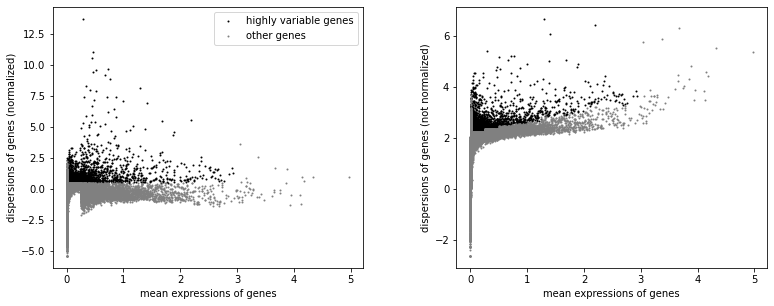

In [13]:
sc.pp.normalize_total(maize_Data, target_sum=1e4)
sc.pp.log1p(maize_Data)

sc.pp.highly_variable_genes(maize_Data, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(maize_Data)


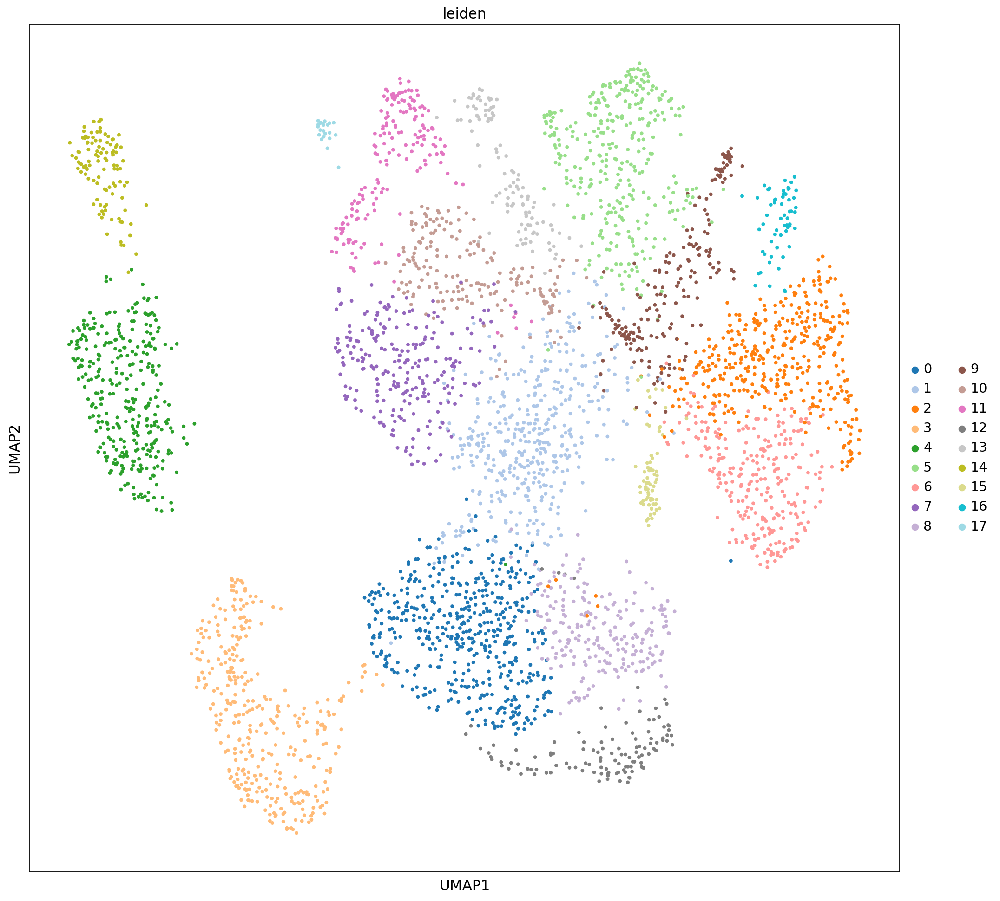

In [14]:
#maize_Data.raw = maize_Data
sc.set_figure_params(facecolor = 'white', figsize = (15,15))
sc.tl.pca(maize_Data, svd_solver='arpack', random_state= 200)
sc.pp.neighbors(maize_Data, n_neighbors=30, n_pcs=50, random_state= 500)
sc.tl.umap(maize_Data, random_state= 221)
sc.tl.leiden(maize_Data, random_state= 1000)

sc.pl.umap(maize_Data, color = 'leiden',palette= 'tab20', s=50)

In [15]:
maize_Data.obs['Cell Cluster Annotation'] = 'Not Annotatoed'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'] == '4'] = 'Epidermis'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'] == '14'] = 'Root Hair'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['8','0','1','7','10', '12', '3'])] = 'Cortex'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['9','5','13'])] = 'Phloem'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['2','6', '15'])] = 'Stele'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'].isin(['17','11'])] = 'Meristematic'
maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'] == '16'] = 'Stele'




/tmp/ipykernel_950478/2911869250.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'] == '4'] = 'Epidermis'
/tmp/ipykernel_950478/2911869250.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  maize_Data.obs['Cell Cluster Annotation'].loc[maize_Data.obs['leiden'] == '14'] = 'Root Hair'
/tmp/ipykernel_950478/2911869250.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

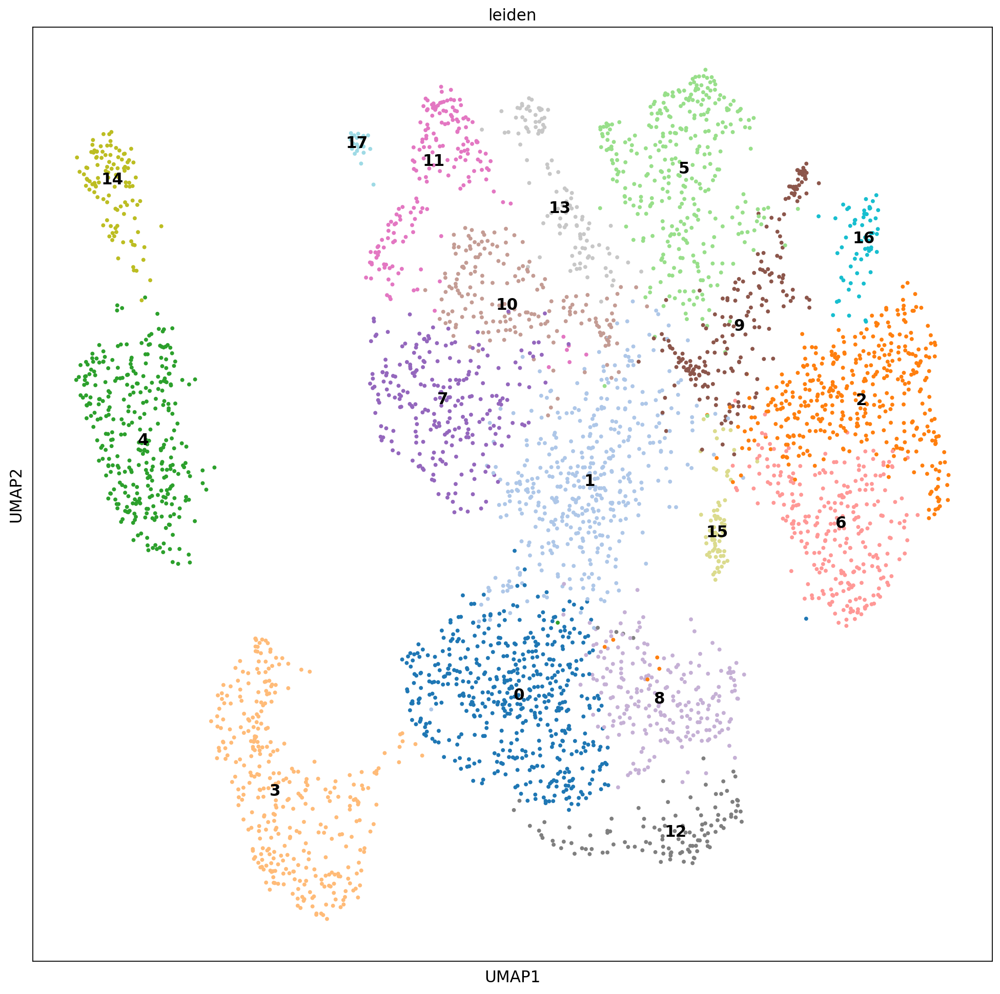

In [16]:
sc.pl.umap(maize_Data, color = 'leiden',palette= 'tab20', s=50, legend_loc = 'on data')

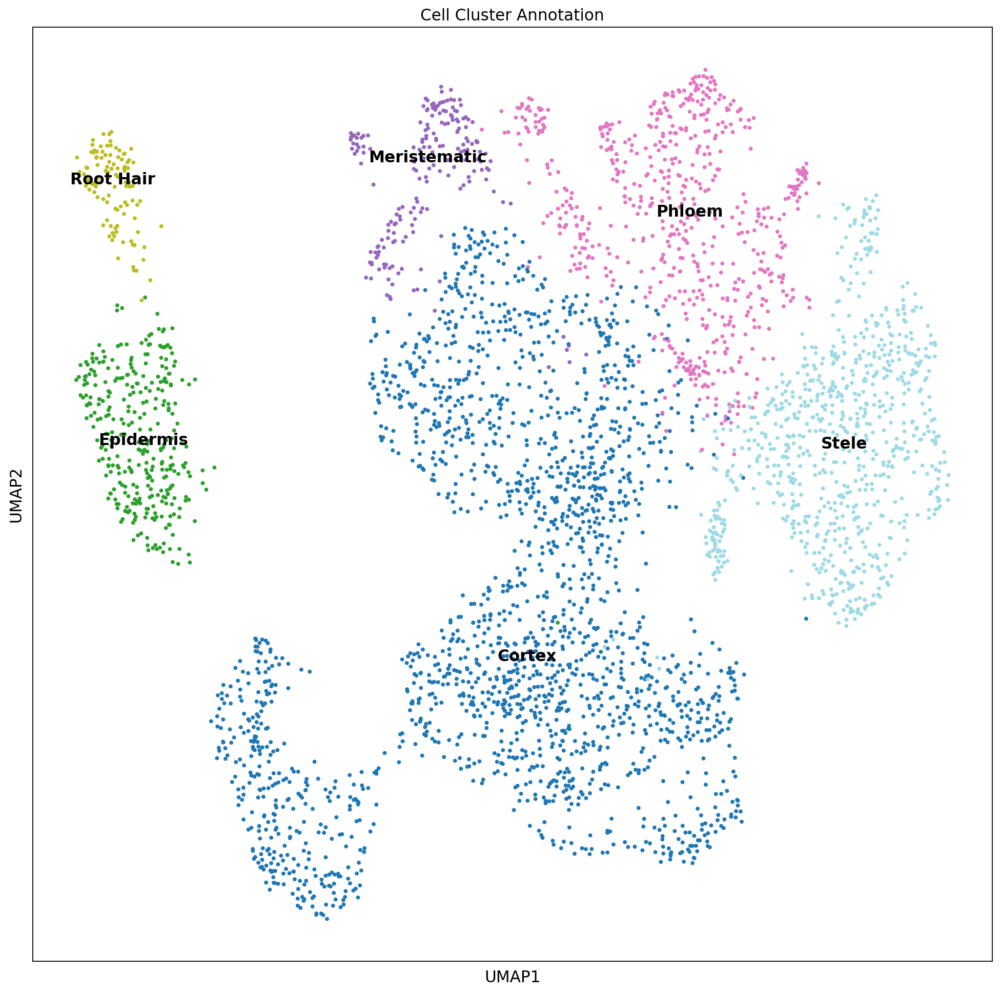

In [17]:
sc.pl.umap(maize_Data, color = 'Cell Cluster Annotation',palette= 'tab20', s=50, legend_loc = 'on data')

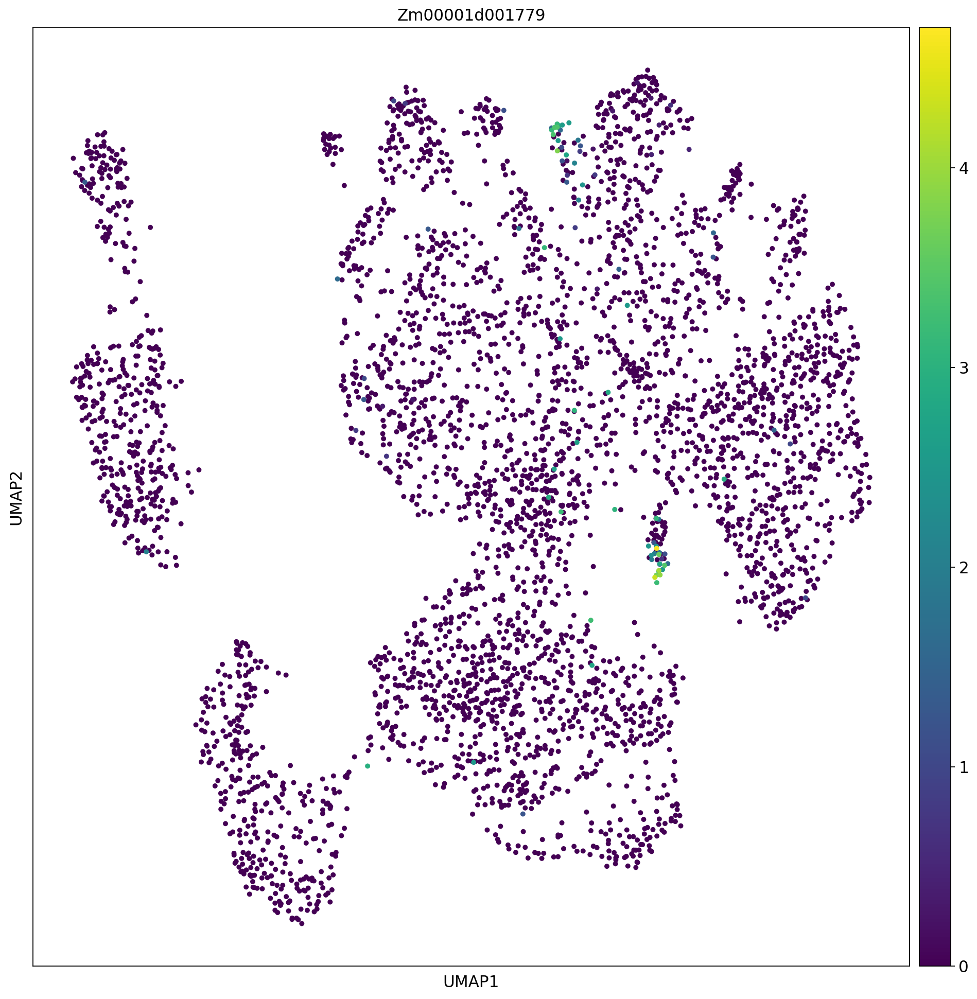

In [18]:
#sc.pl.umap(maize_Data, color =['leiden', 'Zm00001d049541'] ,palette= 'tab20', s=50)
sc.pl.umap(maize_Data, color ='Zm00001d001779' , s=80)

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


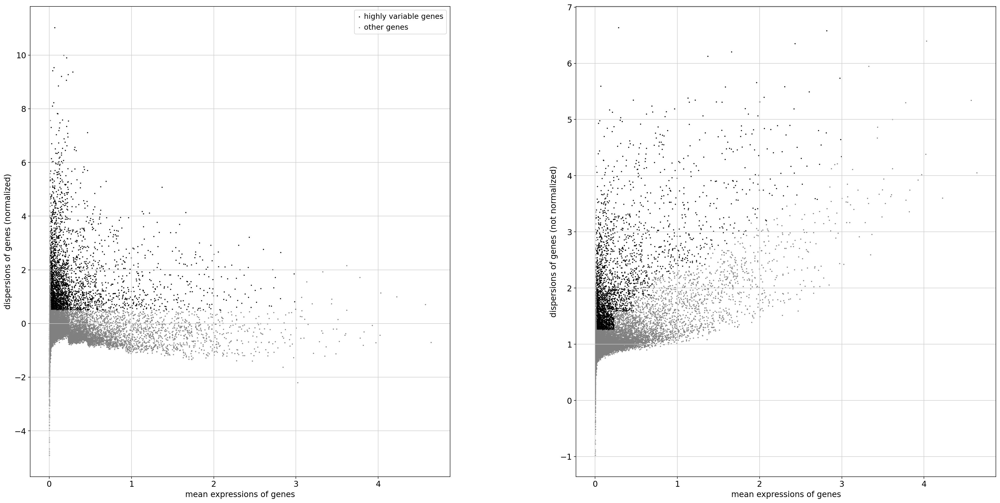

In [19]:
sc.pp.highly_variable_genes(arabidopsis_sc, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(arabidopsis_sc)



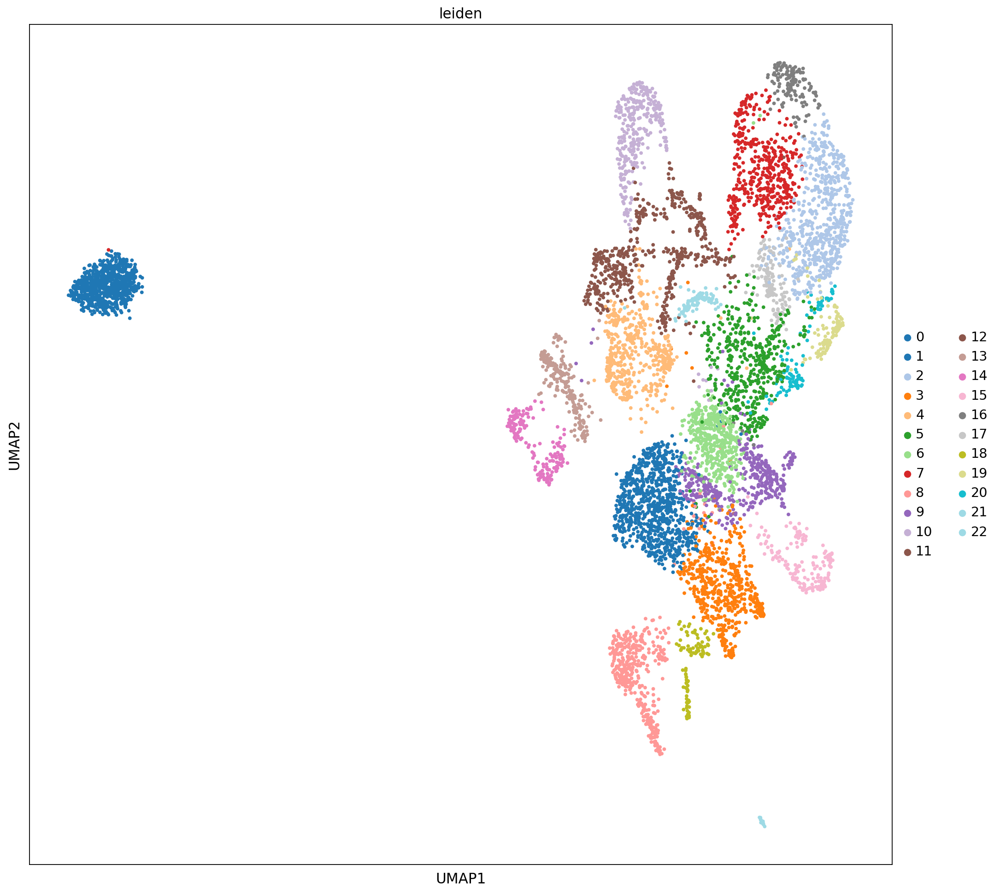

In [20]:
sc.tl.pca(arabidopsis_sc, svd_solver='arpack', random_state= 321)
sc.pp.neighbors(arabidopsis_sc, n_neighbors=20, n_pcs=50, random_state= 75)
sc.tl.umap(arabidopsis_sc, random_state= 267)
sc.tl.leiden(arabidopsis_sc, random_state= 143)

sc.pl.umap(arabidopsis_sc, color = 'leiden',palette= 'tab20', s=50)

In [21]:
umap_df = pd.DataFrame(data = arabidopsis_sc.obsm['X_umap'], columns = ['Axis 1','Axis 2'], index = arabidopsis_sc.obs.index)
umap_df

,Axis 1,Axis 2
Barcode,,
AAACCTGAGAATTCCC,12.415882,6.083405
AAACCTGAGGGCACTA,-20.025967,7.689164
AAACCTGAGTAATCCC,6.506667,12.040573
AAACCTGAGTACGTTC,7.306907,9.832688
AAACCTGAGTATTGGA,10.820136,3.016051
...,...,...
TTTGTCATCAAGGCTT,9.603496,3.542099
TTTGTCATCCCACTTG,7.082306,-5.105612
TTTGTCATCCTGCCAT,11.558331,5.043017


In [22]:
umap_df['Axis 1'].sort_values().head(831)

Barcode
CGCTTCAGTTCCCTTG   -22.373665
ACCTTTACATACAGCT   -22.273302
CGCGGTAGTCATATGC   -22.259459
CCGTGGAAGATATACG   -22.230085
GACGTGCAGGCTACGA   -22.223192
                      ...    
CCCATACCATAGGATA   -18.809650
TCAGCTCTCCTAGTGA   -18.730679
CTACGTCGTTCTGGTA   -18.653570
GATGCTAAGTGCCATT   -18.634516
TGCGTGGAGTGACATA   -18.633524
Name: Axis 1, Length: 831, dtype: float32

In [23]:
bad_values = umap_df.sort_values(by = 'Axis 1').head(831).index
good_obs = arabidopsis_sc.obs.loc[~arabidopsis_sc.obs.index.isin(bad_values)]
arabidopsis_sc  = arabidopsis_sc[good_obs.index,:]


/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


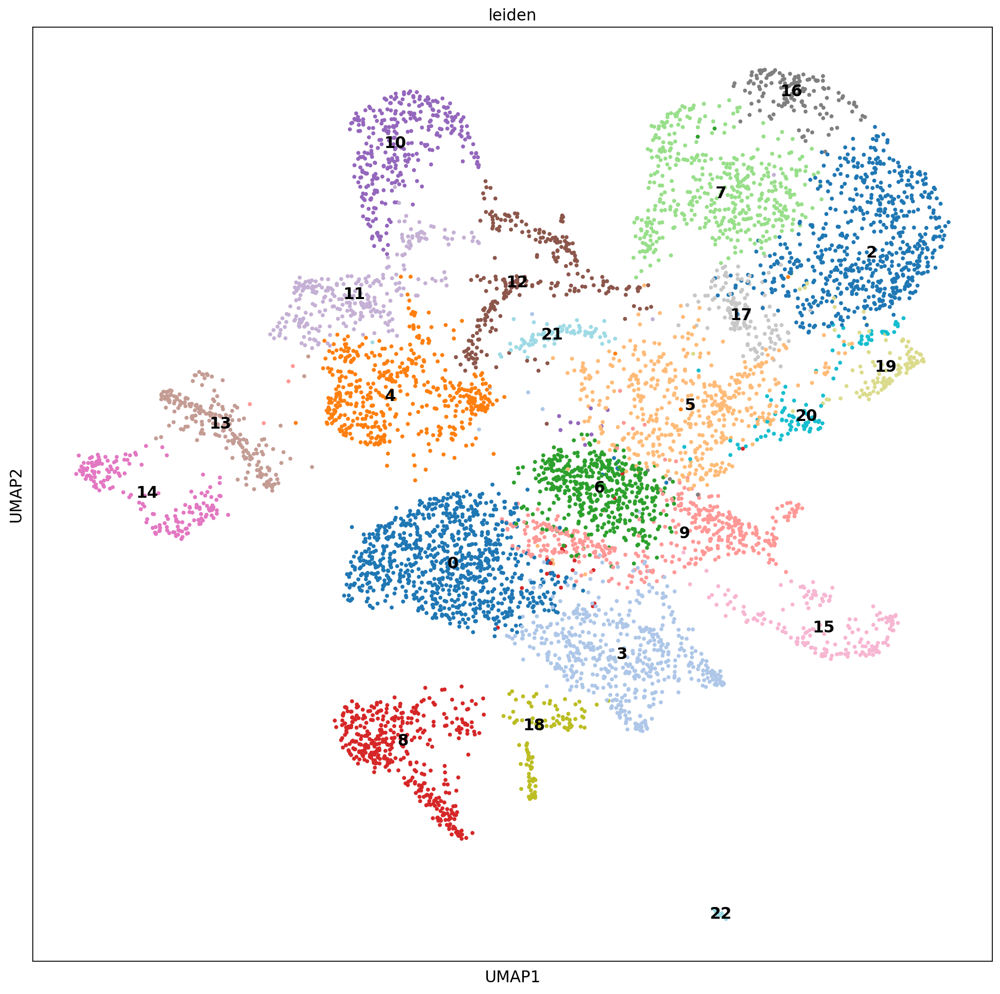

In [24]:
sc.pl.umap(arabidopsis_sc, color = 'leiden',palette= 'tab20', s=50, legend_loc= 'on data')

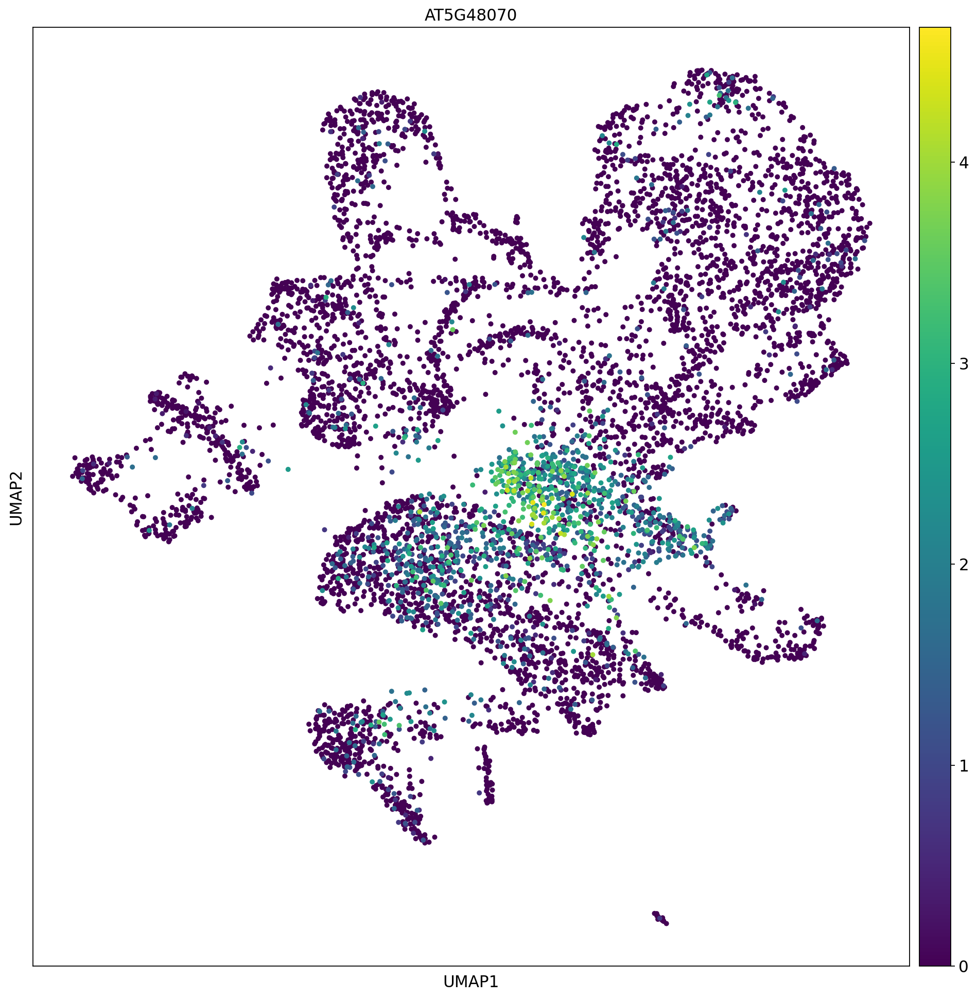

In [25]:
sc.pl.umap(arabidopsis_sc, color ='AT5G48070' , s=80)

In [26]:
types_to_include_in_mapping = ['Epidermis','Root Hair','Phloem','Stele','Meristematic']

In [27]:
arabidopsis_sc.obs['Cell Cluster Annotation'] = 'Not Annotatoed'
arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'].isin(['19', '2'])] = 'Epidermis'
arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'] == '10'] = 'Root Hair'
arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'].isin(['21'])] = 'Cortex'
arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'].isin(['0','8','18'])] = 'Phloem'
arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'].isin(['6','15', '9','13','14','15'])] = 'Stele'
arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'].isin(['5','17','20'])] = 'Meristematic'
arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'].isin(['3','4','7','11','12','16','22'])] = 'Unknown/Not Used For Combination'


/tmp/ipykernel_950478/23983124.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'].isin(['19', '2'])] = 'Epidermis'
/tmp/ipykernel_950478/23983124.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  arabidopsis_sc.obs['Cell Cluster Annotation'].loc[arabidopsis_sc.obs['leiden'] == '10'] = 'Root Hair'
/tmp/ipykernel_950478/23983124.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning

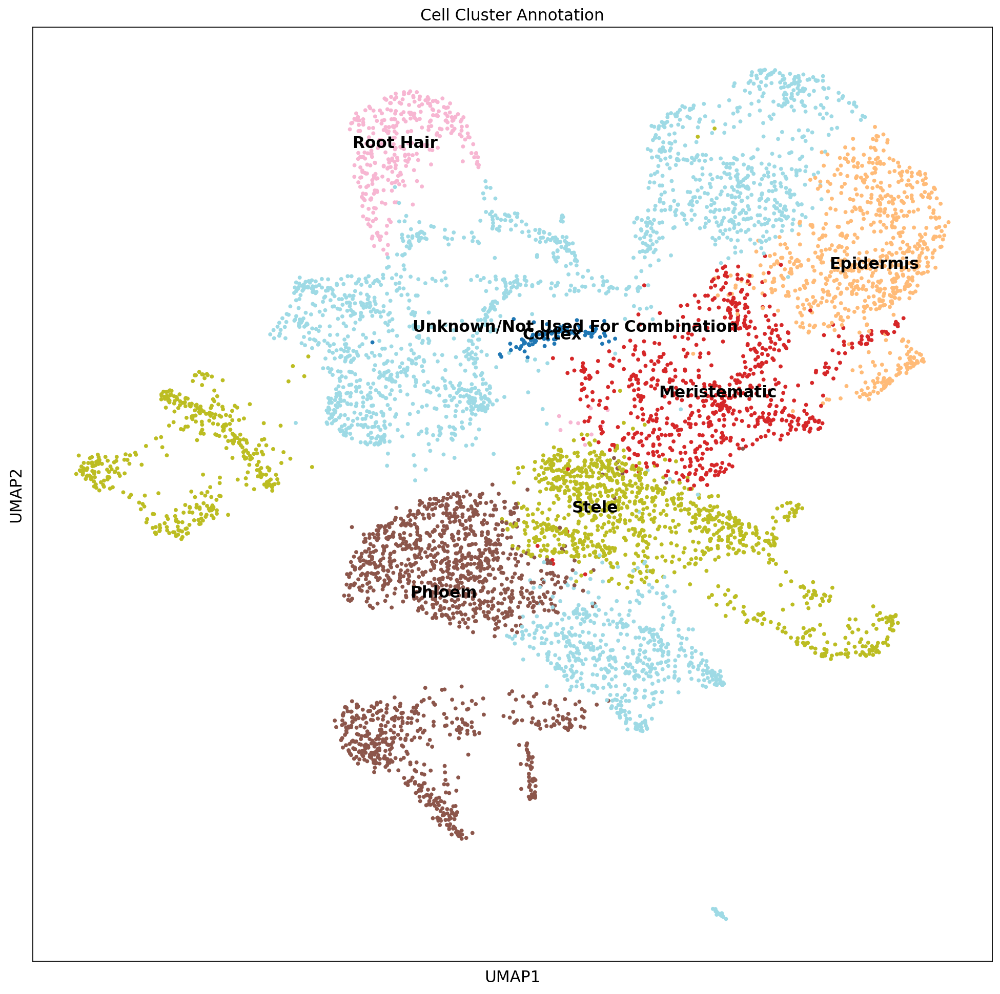

In [28]:
sc.pl.umap(arabidopsis_sc, color = 'Cell Cluster Annotation',palette= 'tab20', s=50, legend_loc = 'on data')

In [29]:
arabidopsis_sc.var['Gene Name'] = arabidopsis_sc.var.index
arabidopsis_sc.var = arabidopsis_sc.var.rename(columns = {'Gene Name':'Gene ID'})
arabidopsis_sc.var = arabidopsis_sc.var.merge(right = co_expressalog_map_85, right_on = 'Arabidopsis Gene', how = 'left', left_on= 'Gene ID')
arabidopsis_sc.var

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


,Gene ID,In CoCoCoNet,highly_variable,means,dispersions,dispersions_norm,Arabidopsis Gene,Maize Gene
0,AT1G01020,1,False,0.201025,0.910928,-0.333120,NaN,NaN
1,AT1G01030,1,False,0.022766,1.057569,0.022509,NaN,NaN
2,AT1G01040,1,False,0.057645,0.975395,-0.176779,AT1G01040,Zm00001d027412
3,AT1G01050,1,False,1.237518,1.313468,-0.853014,AT1G01050,Zm00001d002889
4,AT1G01060,1,False,0.209817,1.143889,0.231849,NaN,NaN
...,...,...,...,...,...,...,...,...
19890,ATMG01350,1,False,0.001509,1.258547,0.509914,NaN,NaN
19891,ATMG01360,1,False,0.515715,1.118924,-0.567870,NaN,NaN
19892,ATMG01370,1,False,0.037064,1.036257,-0.029178,NaN,NaN
19893,ATMG01390,1,False,1.062062,2.020124,0.102415,NaN,NaN


In [30]:
arabidopsis_sc.var = arabidopsis_sc.var.set_index('Gene ID')
arabidopsis_sc.var

,In CoCoCoNet,highly_variable,means,dispersions,dispersions_norm,Arabidopsis Gene,Maize Gene
Gene ID,,,,,,,
AT1G01020,1,False,0.201025,0.910928,-0.333120,NaN,NaN
AT1G01030,1,False,0.022766,1.057569,0.022509,NaN,NaN
AT1G01040,1,False,0.057645,0.975395,-0.176779,AT1G01040,Zm00001d027412
AT1G01050,1,False,1.237518,1.313468,-0.853014,AT1G01050,Zm00001d002889
AT1G01060,1,False,0.209817,1.143889,0.231849,NaN,NaN
...,...,...,...,...,...,...,...
ATMG01350,1,False,0.001509,1.258547,0.509914,NaN,NaN
ATMG01360,1,False,0.515715,1.118924,-0.567870,NaN,NaN
ATMG01370,1,False,0.037064,1.036257,-0.029178,NaN,NaN


In [31]:
maize_Data.var = maize_Data.var.merge(right = co_expressalog_map_85, how = 'left', right_on= 'Maize Gene', left_on='gene_ids')
maize_Data.var

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


,gene_ids,feature_types,In CoCoCoNet,highly_variable,means,dispersions,dispersions_norm,Arabidopsis Gene,Maize Gene
0,Zm00001d027231,Gene Expression,1,False,2.520810e-01,2.164560,-0.380041,NaN,NaN
1,Zm00001d027232,Gene Expression,1,False,1.000000e-12,NaN,0.000000,NaN,NaN
2,Zm00001d027233,Gene Expression,1,False,6.043349e-04,0.223102,-1.953361,NaN,NaN
3,Zm00001d027236,Gene Expression,1,False,2.388622e-02,2.239849,0.489377,NaN,NaN
4,Zm00001d027239,Gene Expression,1,False,2.744667e-02,2.052797,0.262814,NaN,NaN
...,...,...,...,...,...,...,...,...,...
25950,ENSRNA049479090,Gene Expression,1,True,8.779240e-02,2.556639,0.873081,NaN,NaN
25951,ENSRNA049478822,Gene Expression,1,True,5.090141e-01,2.678254,1.157485,NaN,NaN
25952,ENSRNA049478534,Gene Expression,1,True,9.616010e-02,2.586654,0.909436,NaN,NaN
25953,ENSRNA049478530,Gene Expression,1,True,3.340918e-01,2.660385,1.780093,NaN,NaN


In [32]:
arabi_var_names_with_ortholog = arabidopsis_sc.var.dropna().index
arabi_version_of_maize_genes_with_ortholog = maize_Data.var.dropna()['Arabidopsis Gene'].to_list()

arabi_var_names_with_ortholog
overlap_of_shared_genes = arabi_var_names_with_ortholog.intersection(arabi_version_of_maize_genes_with_ortholog)

maize_genes_to_keep = maize_Data.var.loc[maize_Data.var['Arabidopsis Gene'].isin(overlap_of_shared_genes)].index

In [33]:
maize_Data.var = maize_Data.var.set_index('gene_ids')


In [34]:
maize_genes_to_keep

Int64Index([   14,    18,    19,    22,    31,    33,    34,    35,    40,
               45,
            ...
            25879, 25882, 25890, 25902, 25915, 25916, 25929, 25938, 25939,
            25942],
           dtype='int64', length=6047)

In [35]:
maize_single_cell_trimmed_to_orthologs = maize_Data[:,maize_genes_to_keep]
maize_single_cell_trimmed_to_orthologs

View of AnnData object with n_obs × n_vars = 4101 × 6047
    obs: 'leiden', 'Cell Cluster Annotation'
    var: 'feature_types', 'In CoCoCoNet', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Arabidopsis Gene', 'Maize Gene'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [36]:
arabi_single_cell_slimmed_to_orthologs = arabidopsis_sc[:,overlap_of_shared_genes]
arabi_single_cell_slimmed_to_orthologs

View of AnnData object with n_obs × n_vars = 6864 × 6047
    obs: 'Barcode', 'leiden', 'Cell Cluster Annotation'
    var: 'In CoCoCoNet', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Arabidopsis Gene', 'Maize Gene'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [37]:
maize_single_cell_trimmed_to_orthologs.var.index = maize_single_cell_trimmed_to_orthologs.var['Arabidopsis Gene'].to_list()
maize_single_cell_trimmed_to_orthologs.var

,feature_types,In CoCoCoNet,highly_variable,means,dispersions,dispersions_norm,Arabidopsis Gene,Maize Gene
AT4G17610,Gene Expression,1,False,0.055275,2.062388,0.274431,AT4G17610,Zm00001d027259
AT3G60340,Gene Expression,1,False,0.384962,2.359472,0.469123,AT3G60340,Zm00001d027267
AT5G61520,Gene Expression,1,False,0.009444,1.492043,-0.416386,AT5G61520,Zm00001d027268
AT5G61510,Gene Expression,1,True,0.127049,2.438514,0.730005,AT5G61510,Zm00001d027276
AT2G45180,Gene Expression,1,True,2.323198,3.834766,1.458219,AT2G45180,Zm00001d027291
...,...,...,...,...,...,...,...,...
AT3G56220,Gene Expression,1,False,0.011574,2.456366,0.751628,AT3G56220,Zm00001d000400
AT4G10170,Gene Expression,1,False,0.531311,2.250245,-0.277641,AT4G10170,Zm00001d000424
AT2G15980,Gene Expression,1,False,0.051401,2.146415,0.376207,AT2G15980,Zm00001d000435
AT5G51150,Gene Expression,1,False,0.150906,2.167209,0.401393,AT5G51150,Zm00001d000436


In [38]:
order_of_vars = arabi_single_cell_slimmed_to_orthologs.var.index.to_list()
current_order_maize_vars = maize_single_cell_trimmed_to_orthologs.var_names
panda_version_of_maize_x_data = pd.DataFrame(columns = current_order_maize_vars, data = maize_single_cell_trimmed_to_orthologs.X.todense())
re_ordered_version = panda_version_of_maize_x_data.reindex(columns = order_of_vars)
re_ordered_version = sparse.csr_matrix(re_ordered_version.values)
maize_single_cell_trimmed_to_orthologs.X = re_ordered_version
maize_single_cell_trimmed_to_orthologs.var = maize_single_cell_trimmed_to_orthologs.var.reindex(order_of_vars)

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/scipy/sparse/_index.py:137: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray_sparse(i, j, x)


In [39]:
maize_single_cell_trimmed_to_orthologs.obs['Cluster Before Gene Trimming'] = maize_single_cell_trimmed_to_orthologs.obs['leiden']
maize_single_cell_trimmed_to_orthologs.uns['Before Trimming Colors'] = maize_single_cell_trimmed_to_orthologs.uns['leiden_colors']
maize_single_cell_trimmed_to_orthologs.obsm['Before Trimming X_umap'] = maize_single_cell_trimmed_to_orthologs.obsm['X_umap']
maize_single_cell_trimmed_to_orthologs

AnnData object with n_obs × n_vars = 4101 × 6047
    obs: 'leiden', 'Cell Cluster Annotation', 'Cluster Before Gene Trimming'
    var: 'feature_types', 'In CoCoCoNet', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Arabidopsis Gene', 'Maize Gene'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors', 'Before Trimming Colors'
    obsm: 'X_pca', 'X_umap', 'Before Trimming X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [40]:
arabi_single_cell_slimmed_to_orthologs.obs['Cluster Before Gene Trimming'] = arabi_single_cell_slimmed_to_orthologs.obs['leiden']
arabi_single_cell_slimmed_to_orthologs.uns['Before Trimming Colors'] = arabi_single_cell_slimmed_to_orthologs.uns['leiden_colors']
arabi_single_cell_slimmed_to_orthologs.obsm['Before Trimming X_umap'] = arabi_single_cell_slimmed_to_orthologs.obsm['X_umap']
arabi_single_cell_slimmed_to_orthologs

/tmp/ipykernel_950478/1648653917.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  arabi_single_cell_slimmed_to_orthologs.obs['Cluster Before Gene Trimming'] = arabi_single_cell_slimmed_to_orthologs.obs['leiden']


AnnData object with n_obs × n_vars = 6864 × 6047
    obs: 'Barcode', 'leiden', 'Cell Cluster Annotation', 'Cluster Before Gene Trimming'
    var: 'In CoCoCoNet', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Arabidopsis Gene', 'Maize Gene'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors', 'Before Trimming Colors'
    obsm: 'X_pca', 'X_umap', 'Before Trimming X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

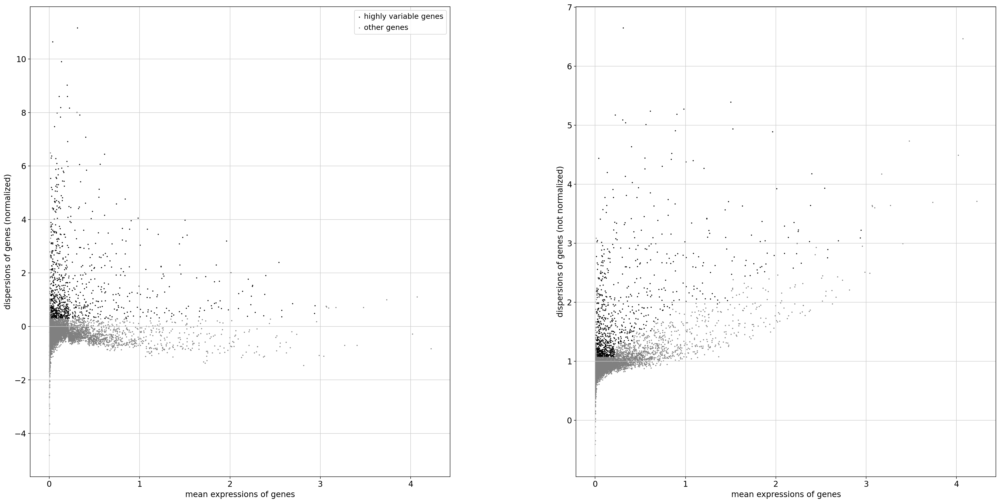

In [41]:
sc.pp.highly_variable_genes(arabi_single_cell_slimmed_to_orthologs, min_mean=0.0125, max_mean=3, min_disp=0.3)
sc.pl.highly_variable_genes(arabi_single_cell_slimmed_to_orthologs)


In [42]:
arabi_single_cell_slimmed_to_orthologs =arabi_single_cell_slimmed_to_orthologs[arabi_single_cell_slimmed_to_orthologs.obs.loc[arabi_single_cell_slimmed_to_orthologs.obs['Cell Cluster Annotation'].isin(types_to_include_in_mapping)].index,:]
arabi_single_cell_slimmed_to_orthologs

View of AnnData object with n_obs × n_vars = 4610 × 6047
    obs: 'Barcode', 'leiden', 'Cell Cluster Annotation', 'Cluster Before Gene Trimming'
    var: 'In CoCoCoNet', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Arabidopsis Gene', 'Maize Gene'
    uns: 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors', 'Before Trimming Colors'
    obsm: 'X_pca', 'X_umap', 'Before Trimming X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

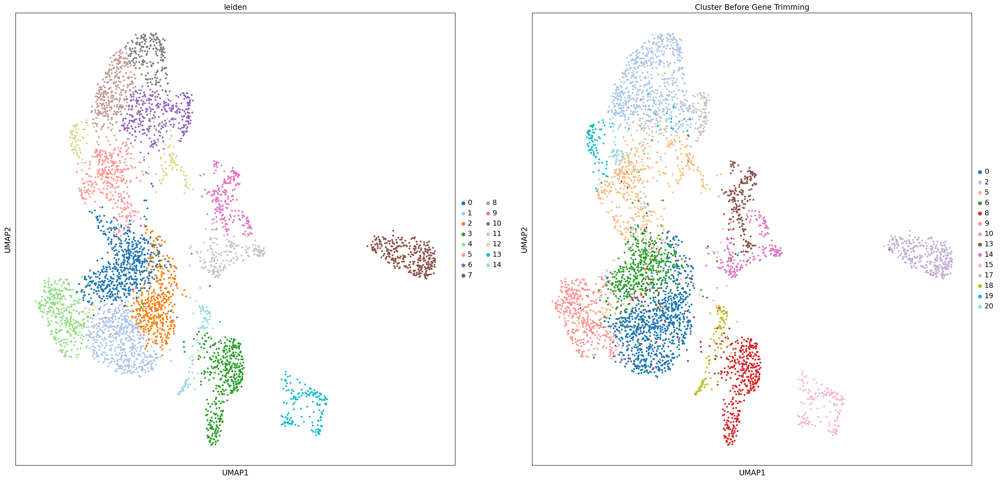

In [43]:
sc.tl.pca(arabi_single_cell_slimmed_to_orthologs, svd_solver='arpack', random_state= 43)
sc.pp.neighbors(arabi_single_cell_slimmed_to_orthologs, n_neighbors=20, n_pcs=50, random_state= 89)
sc.tl.umap(arabi_single_cell_slimmed_to_orthologs, random_state= 334)
sc.tl.leiden(arabi_single_cell_slimmed_to_orthologs, random_state= 887)

sc.pl.umap(arabi_single_cell_slimmed_to_orthologs, color = ['leiden','Cluster Before Gene Trimming'], palette= 'tab20', s=50)

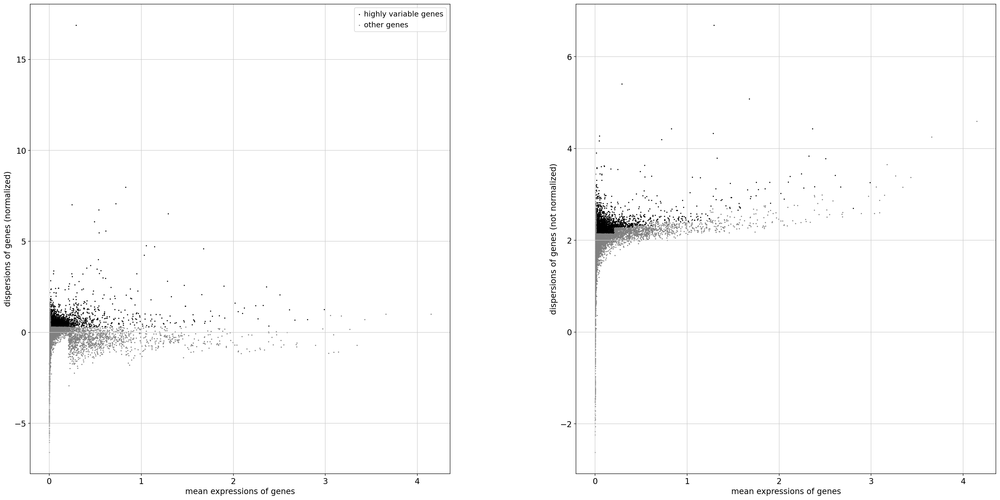

In [44]:
## Previous HVG identification is sufficient 
sc.pp.highly_variable_genes(maize_single_cell_trimmed_to_orthologs, min_mean=0.01, max_mean=3, min_disp=0.3) 
sc.pl.highly_variable_genes(maize_single_cell_trimmed_to_orthologs)


In [45]:
maize_single_cell_trimmed_to_orthologs =maize_single_cell_trimmed_to_orthologs[maize_single_cell_trimmed_to_orthologs.obs.loc[maize_single_cell_trimmed_to_orthologs.obs['Cell Cluster Annotation'].isin(types_to_include_in_mapping)].index,:]
maize_single_cell_trimmed_to_orthologs

View of AnnData object with n_obs × n_vars = 2062 × 6047
    obs: 'leiden', 'Cell Cluster Annotation', 'Cluster Before Gene Trimming'
    var: 'feature_types', 'In CoCoCoNet', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'Arabidopsis Gene', 'Maize Gene'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Cell Cluster Annotation_colors', 'Before Trimming Colors'
    obsm: 'X_pca', 'X_umap', 'Before Trimming X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

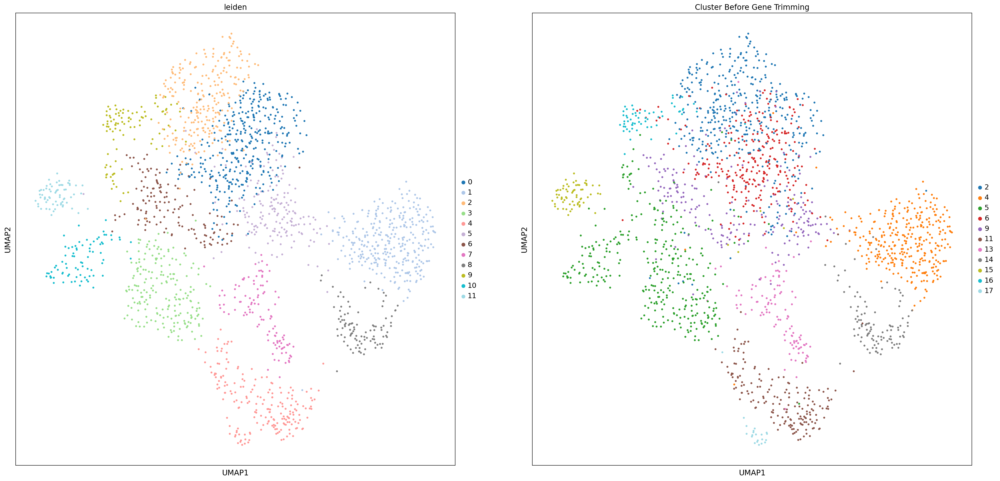

In [46]:
sc.tl.pca(maize_single_cell_trimmed_to_orthologs, svd_solver='arpack', random_state= 43)
sc.pp.neighbors(maize_single_cell_trimmed_to_orthologs, n_neighbors=20, n_pcs=50, random_state= 89)
sc.tl.umap(maize_single_cell_trimmed_to_orthologs, random_state= 334)
sc.tl.leiden(maize_single_cell_trimmed_to_orthologs, random_state= 887)

sc.pl.umap(maize_single_cell_trimmed_to_orthologs, color = ['leiden','Cluster Before Gene Trimming'], palette= 'tab20', s=50)

In [47]:
maize_single_cell_trimmed_to_orthologs.obs['Original Cell Cluster Annotation'] = maize_single_cell_trimmed_to_orthologs.obs['Cell Cluster Annotation']
arabi_single_cell_slimmed_to_orthologs.obs['Original Cell Cluster Annotation'] = arabi_single_cell_slimmed_to_orthologs.obs['Cell Cluster Annotation']

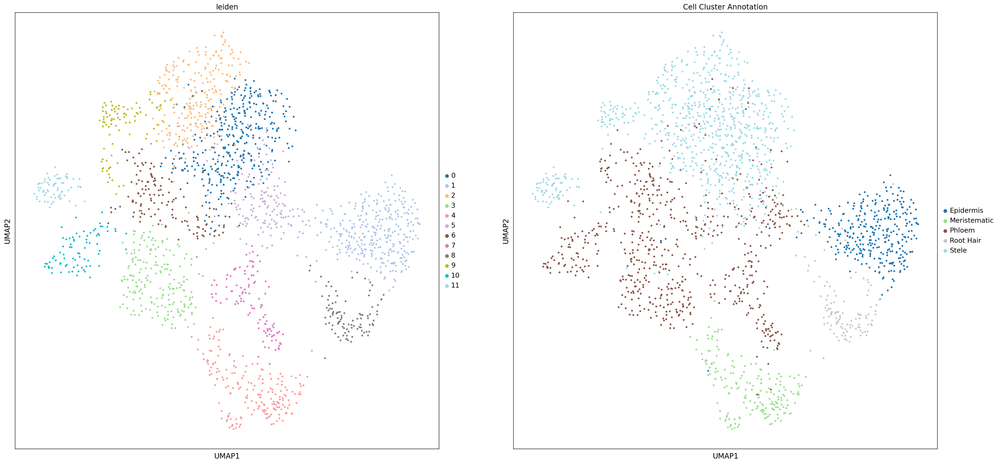

In [48]:
sc.pl.umap(maize_single_cell_trimmed_to_orthologs, color = ['leiden','Cell Cluster Annotation'], palette= 'tab20', s=50)

In [49]:
# ### Arabidopsis Reference

# sc.tl.ingest(maize_single_cell_trimmed_to_orthologs, arabi_single_cell_slimmed_to_orthologs, obs='Cell Cluster Annotation')

# maize_single_cell_trimmed_to_orthologs.uns['leiden_colors'] = arabi_single_cell_slimmed_to_orthologs.uns['leiden_colors']  # fix colors

# concatendated_arabi_maize_dataset = arabi_single_cell_slimmed_to_orthologs.concatenate(maize_single_cell_trimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Arabidopsis','Maize'])
# concatendated_arabi_maize_dataset.obs.leiden = concatendated_arabi_maize_dataset.obs.leiden.astype('category')
# concatendated_arabi_maize_dataset.obs.leiden.cat.reorder_categories(arabi_single_cell_slimmed_to_orthologs.obs.leiden.cat.categories, inplace=True)  # fix category ordering
# concatendated_arabi_maize_dataset.uns['leiden_colors'] = arabi_single_cell_slimmed_to_orthologs.uns['leiden_colors'] 
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species', 'leiden'], s= 50)


In [50]:
#sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species', 'Cell Cluster Annotation'], s= 50)


In [51]:
#sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species'], s= 25)

In [52]:
#sc.pl.umap(concatendated_arabi_maize_dataset, color=['Original Cell Cluster Annotation'], s= 25)


In [53]:
# subset = concatendated_arabi_maize_dataset[concatendated_arabi_maize_dataset.obs['Original Cell Cluster Annotation'] == 'Stele']
# sc.pl.umap(subset, color=['Species'], s= 25)

In [54]:
import pymn

# pymn.variableGenes(concatendated_arabi_maize_dataset,study_col = 'Species')
# pymn.MetaNeighborUS(concatendated_arabi_maize_dataset,study_col = 'Species',ct_col = 'Original Cell Cluster Annotation')
# g = pymn.plotMetaNeighborUS(concatendated_arabi_maize_dataset,figsize = (20,20),cmap = 'coolwarm',fontsize = 15,show = False,)
# #g.savefig('/home/passala/Gene_duplication_project/Code/Bruno_maize_sorghum_project/Figures/new_data_only_across_species.jpg')

In [55]:
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species', 'leiden'], s= 50)


In [56]:
# ### Maize Reference -- Worse than Arabidopsis Reference

# sc.tl.ingest(arabi_single_cell_slimmed_to_orthologs, maize_single_cell_trimmed_to_orthologs, obs='Cell Cluster Annotation')

# arabi_single_cell_slimmed_to_orthologs.uns['leiden_colors'] = maize_single_cell_trimmed_to_orthologs.uns['leiden_colors']  # fix colors

# concatendated_arabi_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(arabi_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Arabidopsis'])
# concatendated_arabi_maize_dataset.obs.leiden = concatendated_arabi_maize_dataset.obs.leiden.astype('category')
# #concatendated_arabi_maize_dataset.obs.leiden.cat.reorder_categories(maize_single_cell_trimmed_to_orthologs.obs.leiden.cat.categories, inplace=True)  # fix category ordering
# concatendated_arabi_maize_dataset.uns['leiden_colors'] = maize_single_cell_trimmed_to_orthologs.uns['leiden_colors'] 
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species', 'Cell Cluster Annotation'], s= 50)

In [57]:
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species', 'Cell Cluster Annotation'], s= 50)

In [58]:
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Original Cell Cluster Annotation'], s= 25)


In [59]:
# subset = concatendated_arabi_maize_dataset[concatendated_arabi_maize_dataset.obs['Original Cell Cluster Annotation'] == 'Stele']
# sc.pl.umap(subset, color=['Species'], s= 25)

In [60]:
# import pymn

# pymn.variableGenes(concatendated_arabi_maize_dataset,study_col = 'Species')
# pymn.MetaNeighborUS(concatendated_arabi_maize_dataset,study_col = 'Species',ct_col = 'Original Cell Cluster Annotation')
# g = pymn.plotMetaNeighborUS(concatendated_arabi_maize_dataset,figsize = (20,20),cmap = 'coolwarm',fontsize = 15,show = False,)
# #g.savefig('/home/passala/Gene_duplication_project/Code/Bruno_maize_sorghum_project/Figures/new_data_only_across_species.jpg')

In [61]:

## BBKNN -- Sucks
# sc.tl.pca(concatendated_arabi_maize_dataset)
# sc.external.pp.bbknn(concatendated_arabi_maize_dataset, batch_key='Species')
# sc.tl.umap(concatendated_arabi_maize_dataset)
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species', 'leiden'], s= 50)

In [62]:
# concatendated_arabi_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(arabi_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Arabidopsis'])


In [63]:
## Scanorama Tutorial Way -- Doesn't work
# concatendated_arabi_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(arabi_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Arabidopsis'])

# adatas = [maize_single_cell_trimmed_to_orthologs,arabi_single_cell_slimmed_to_orthologs]
# scanorama.integrate_scanpy(adatas, dimred = 50)
# scanorama_int = [ad.obsm['X_scanorama'] for ad in adatas]

# # make into one matrix.
# all_s = np.concatenate(scanorama_int)
# print(all_s.shape)

# # add to the AnnData object
# concatendated_arabi_maize_dataset.obsm["Scanorama"] = all_s
# sc.pp.neighbors(concatendated_arabi_maize_dataset, n_pcs =50, use_rep = "Scanorama")
# sc.tl.umap(concatendated_arabi_maize_dataset)
# sc.pl.umap(concatendated_arabi_maize_dataset, color=['Species', 'leiden'], s= 50)

In [64]:
# ## External Scanpy Tutorial Docs Page Way 

# concatendated_arabi_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(arabi_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Arabidopsis'])

# sc.pp.highly_variable_genes(concatendated_arabi_maize_dataset, min_mean=0.01, max_mean=3, min_disp=0.3) 

# #sc.tl.pca(concatendated_arabi_maize_dataset, svd_solver='arpack', random_state= 567)
# sc.external.pp.scanorama_integrate(concatendated_arabi_maize_dataset, 'Species')

# sc.pp.neighbors(concatendated_arabi_maize_dataset, n_neighbors=20, n_pcs=50, random_state= 22, use_rep= 'X_scanorama' )
# sc.tl.umap(concatendated_arabi_maize_dataset, random_state= 632)
# sc.tl.leiden(concatendated_arabi_maize_dataset, random_state= 344)

# sc.pl.umap(concatendated_arabi_maize_dataset, color = ['Species','Cluster Before Gene Trimming'], palette= 'tab20', s=50)


In [65]:
# maize_subset = concatendated_arabi_maize_dataset[concatendated_arabi_maize_dataset.obs['Species'] == 'Maize']
# arabidopsis_subset = concatendated_arabi_maize_dataset[concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis']
# sc.pl.umap(maize_subset, color = 'Cluster Before Gene Trimming', palette= 'tab20', s=50)

In [66]:
# sc.pl.umap(arabidopsis_subset, color = 'Cluster Before Gene Trimming', palette= 'tab20', s=50)

In [67]:
### Metaneighbor Pre Integration on New labels and Original Labels
concatendated_arabi_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(arabi_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Arabidopsis'])


/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/seaborn/matrix.py:1214: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


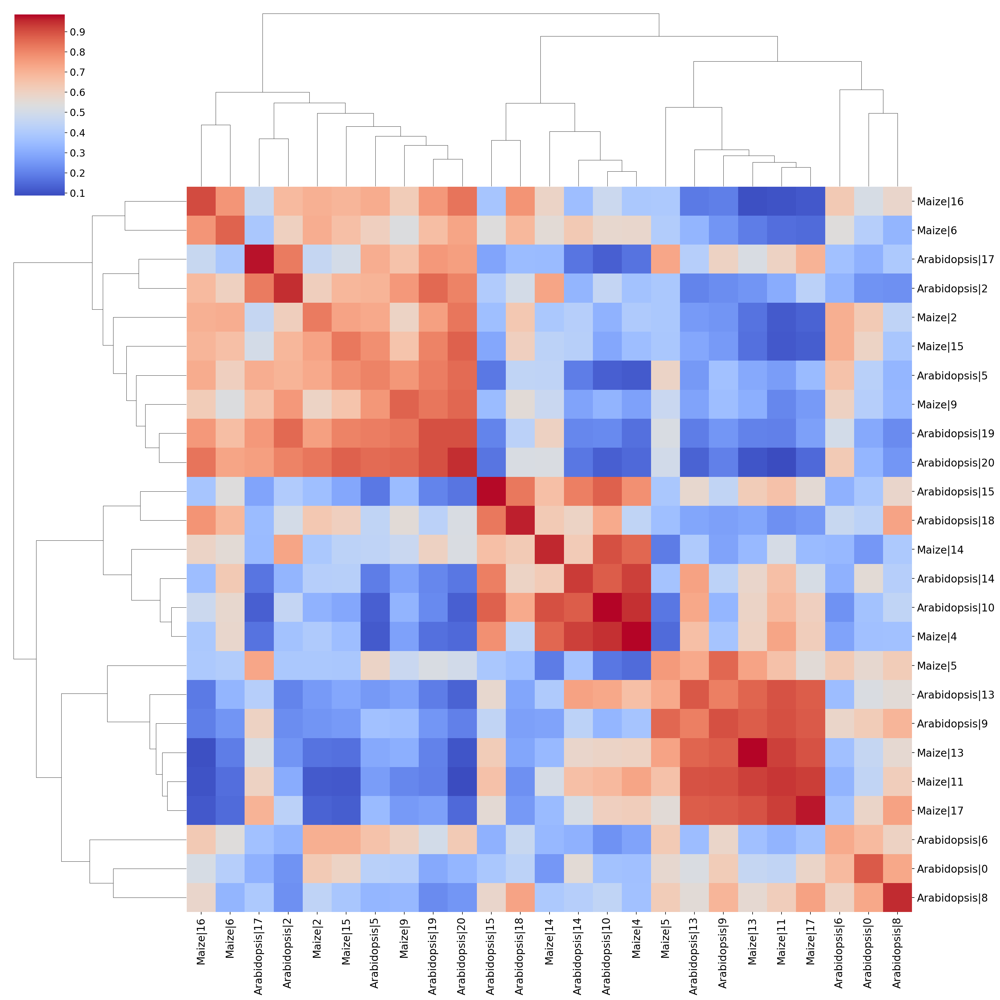

In [68]:
import pymn

pymn.variableGenes(concatendated_arabi_maize_dataset,study_col = 'Species')
pymn.MetaNeighborUS(concatendated_arabi_maize_dataset,study_col = 'Species',ct_col = 'Cluster Before Gene Trimming')
g = pymn.plotMetaNeighborUS(concatendated_arabi_maize_dataset,figsize = (20,20),cmap = 'coolwarm',fontsize = 15,show = False,)
#g.savefig('/home/passala/Gene_duplication_project/Code/Bruno_maize_sorghum_project/Figures/new_data_only_across_species.jpg')

In [69]:
concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'] = concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming']

concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['17','2','5','19','20']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis')] = '17+2+5+19+20'
#concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['19','20']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis')] = '19+20'
concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['15','18']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis')] = '15+18'
concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['14','10']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis')] = '14+10'
concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['8','0']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis')] = '8+0'
concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['13','9']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis')] = '13+9'

concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['16','6']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Maize')] = '16+6'
concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['13','11','17']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Maize')] = '13+11+17'

concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['15','2']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Maize')] = '15+2'




/tmp/ipykernel_950478/2455516738.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['17','2','5','19','20']))&(concatendated_arabi_maize_dataset.obs['Species'] == 'Arabidopsis')] = '17+2+5+19+20'
/tmp/ipykernel_950478/2455516738.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  concatendated_arabi_maize_dataset.obs['Combined_Pre_trimming_clusters'].loc[(concatendated_arabi_maize_dataset.obs['Cluster Before Gene Trimming'].isin(['15','18']))&(concatendated_arabi_maiz

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/seaborn/matrix.py:1214: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


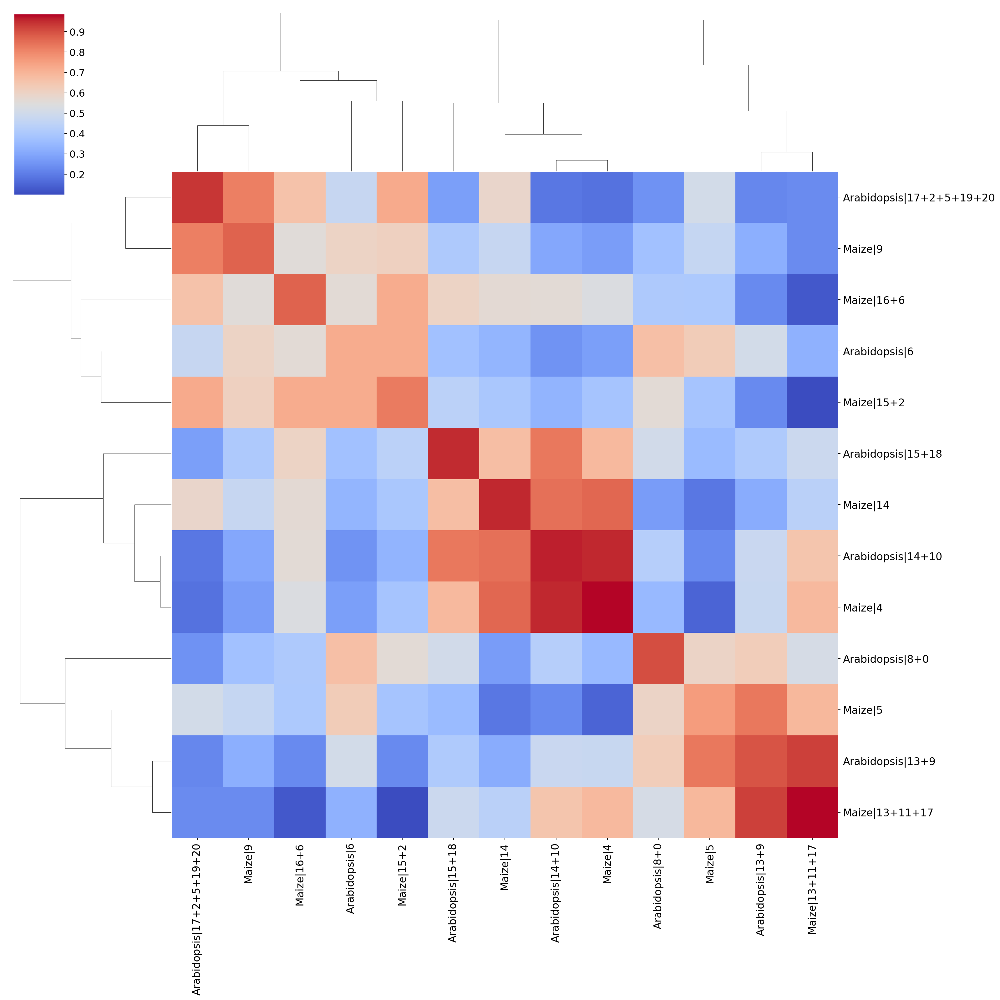

In [70]:
pymn.variableGenes(concatendated_arabi_maize_dataset,study_col = 'Species')
pymn.MetaNeighborUS(concatendated_arabi_maize_dataset,study_col = 'Species',ct_col = 'Combined_Pre_trimming_clusters')
g = pymn.plotMetaNeighborUS(concatendated_arabi_maize_dataset,figsize = (20,20),cmap = 'coolwarm',fontsize = 15,show = False,)
#g.savefig('/home/passala/Gene_duplication_project/Code/Bruno_maize_sorghum_project/Figures/new_data_only_across_species.jpg')

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/seaborn/matrix.py:1214: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


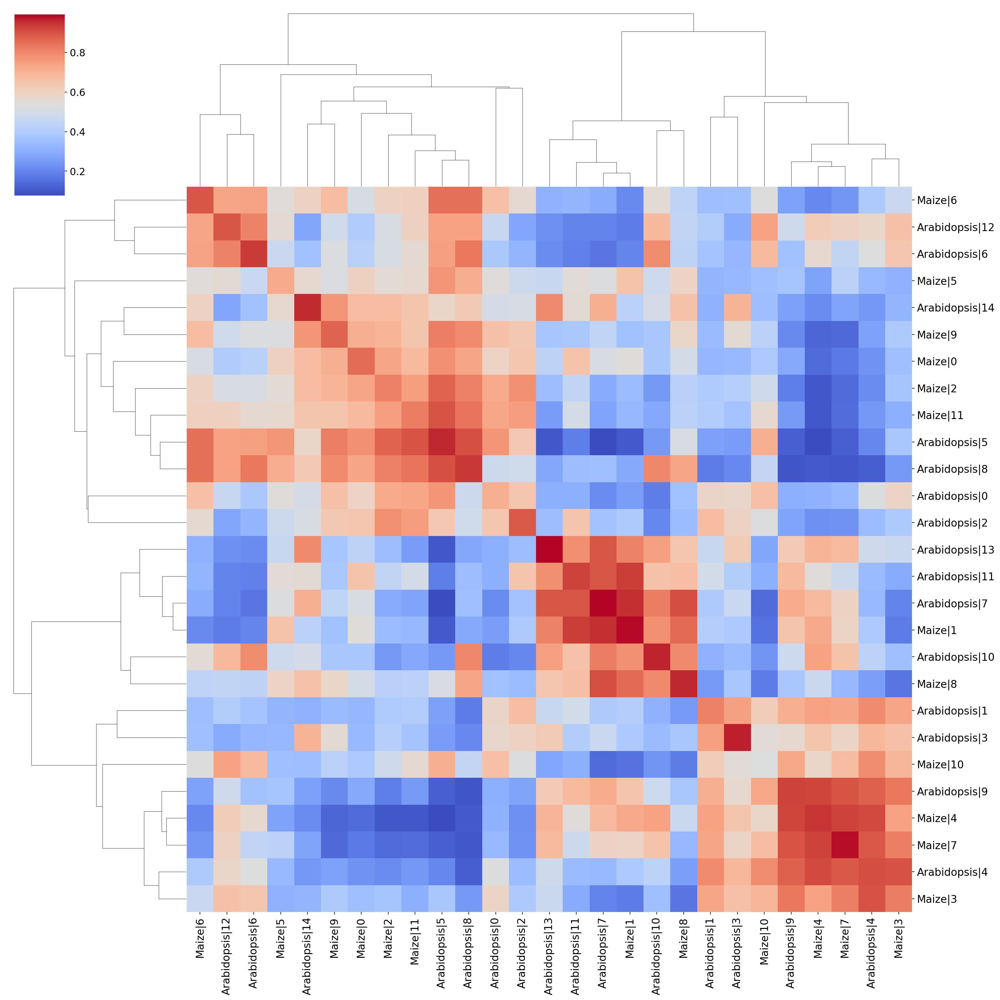

In [71]:
pymn.variableGenes(concatendated_arabi_maize_dataset,study_col = 'Species')
pymn.MetaNeighborUS(concatendated_arabi_maize_dataset,study_col = 'Species',ct_col = 'leiden')
g = pymn.plotMetaNeighborUS(concatendated_arabi_maize_dataset,figsize = (20,20),cmap = 'coolwarm',fontsize = 15,show = False,)
#g.savefig('/home/passala/Gene_duplication_project/Code/Bruno_maize_sorghum_project/Figures/new_data_only_across_species.jpg')

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


[[0.         0.88991271]
 [0.         0.        ]]
Processing datasets Maize <=> Arabidopsis


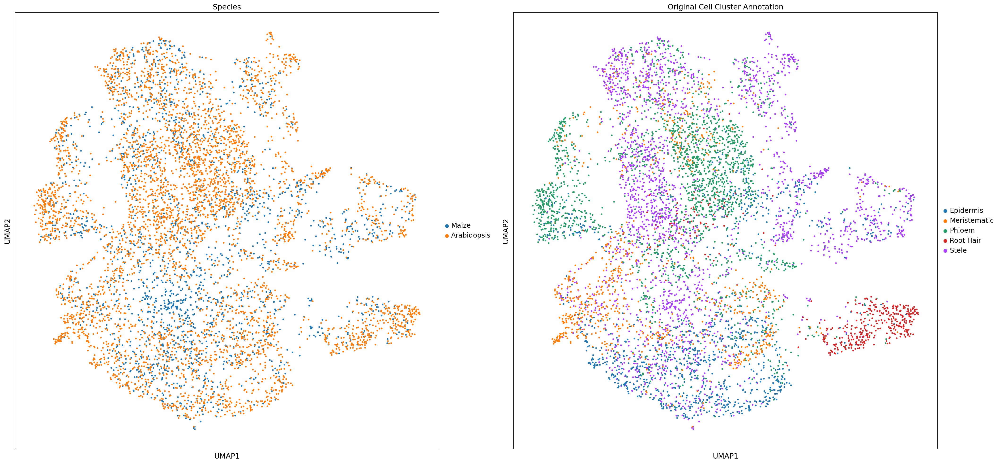

In [72]:
### Scanorama as in Validating By cutting in half 

import scanorama
concatendated_arabi_maize_dataset = maize_single_cell_trimmed_to_orthologs.concatenate(arabi_single_cell_slimmed_to_orthologs, batch_key = 'Species', batch_categories = ['Maize','Arabidopsis'])
#sc.tl.pca(concatenated_alpha_beta_database, svd_solver='arpack', )

sc.external.pp.scanorama_integrate(concatendated_arabi_maize_dataset,'Species')
sc.pp.neighbors(concatendated_arabi_maize_dataset, n_neighbors = 10, n_pcs = 40, use_rep= 'X_scanorama', random_state = 2204)
sc.tl.umap(concatendated_arabi_maize_dataset, random_state= 243)
sc.pl.umap(concatendated_arabi_maize_dataset, color= ['Species', 'Original Cell Cluster Annotation'], s = 40,)

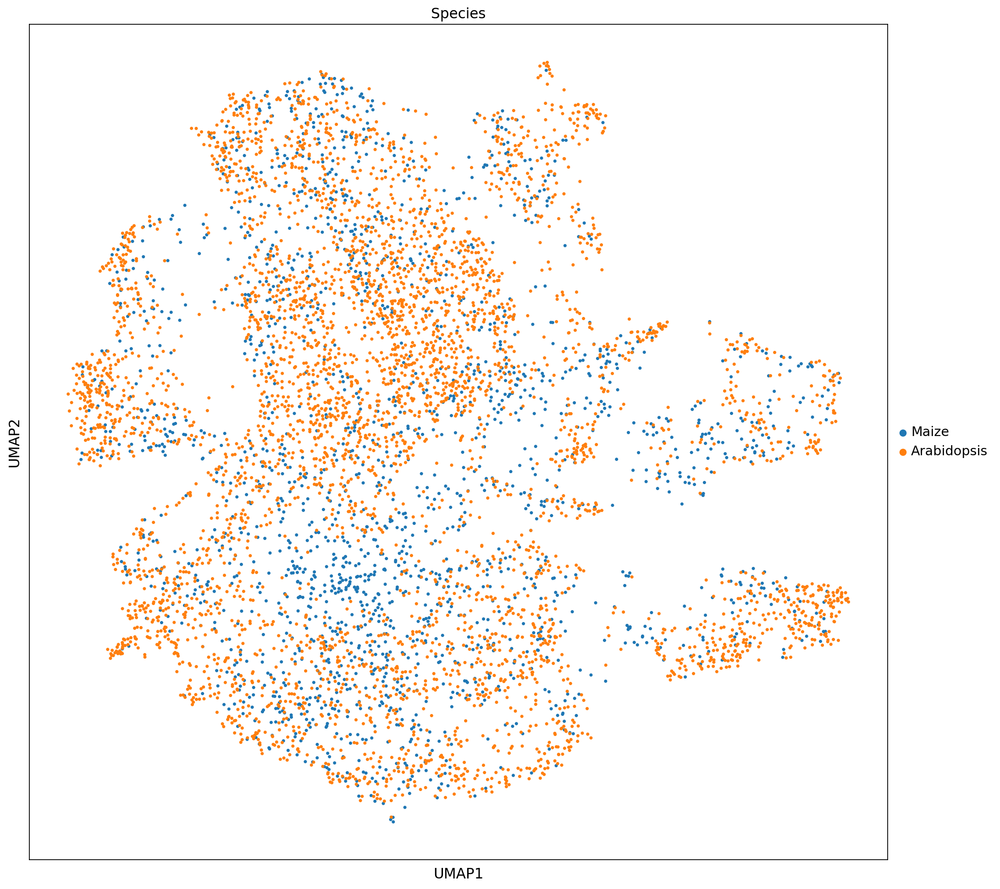

In [73]:
sc.pl.umap(concatendated_arabi_maize_dataset, color= ['Species', ], s = 40,)

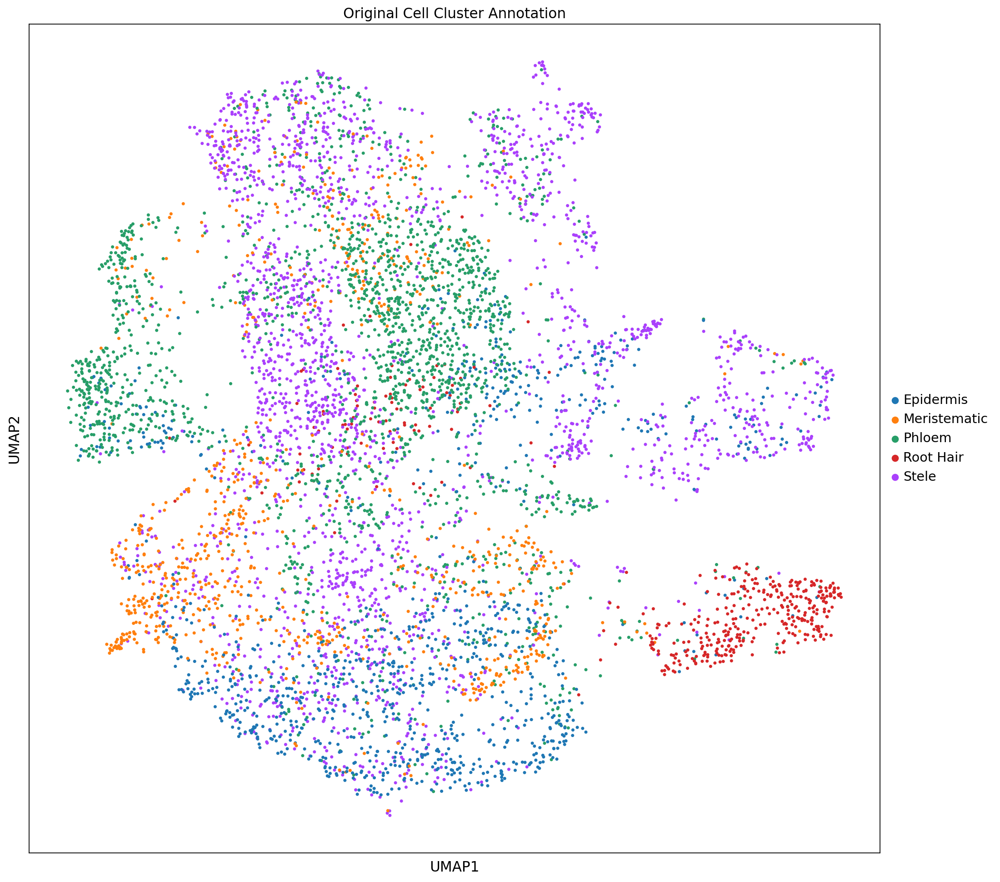

In [74]:
sc.pl.umap(concatendated_arabi_maize_dataset, color= ['Original Cell Cluster Annotation'], s = 40,)

In [75]:
sc.tl.leiden(concatendated_arabi_maize_dataset)

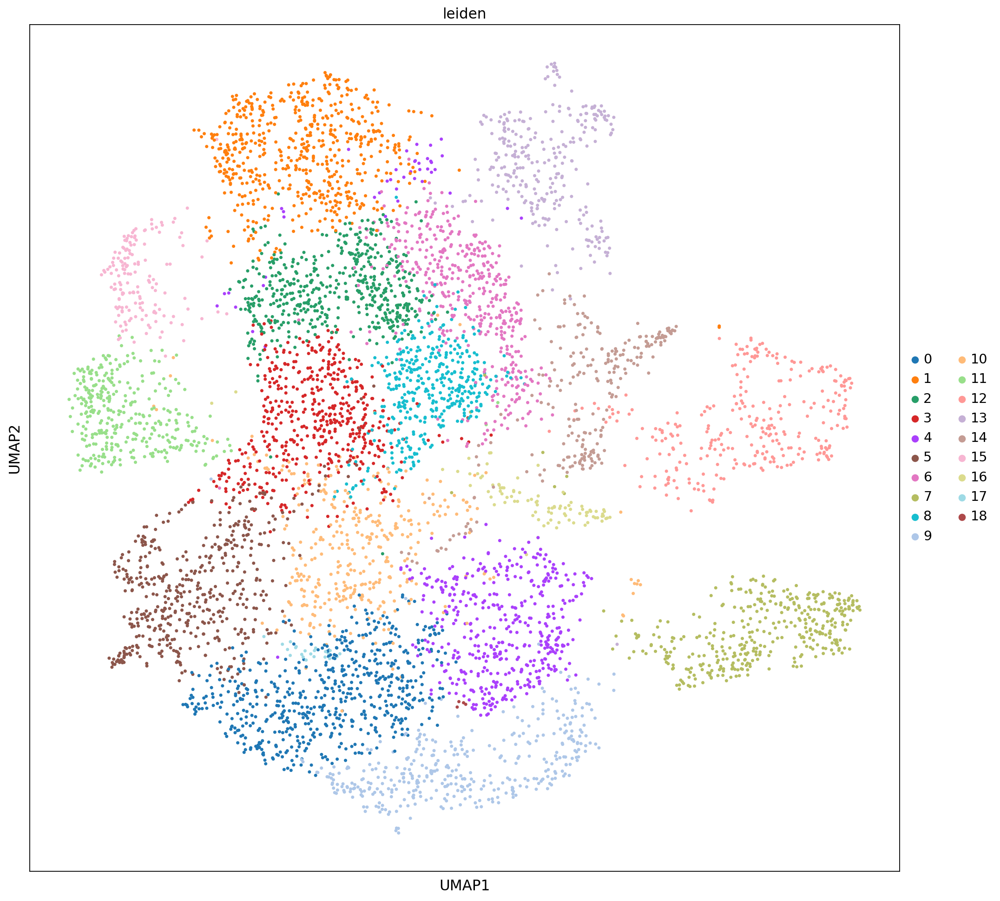

In [76]:
sc.pl.umap(concatendated_arabi_maize_dataset, color= ['leiden'], s = 40,)

/home/passala/miniconda3/envs/Single_cell_data/lib/python3.9/site-packages/seaborn/matrix.py:1214: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


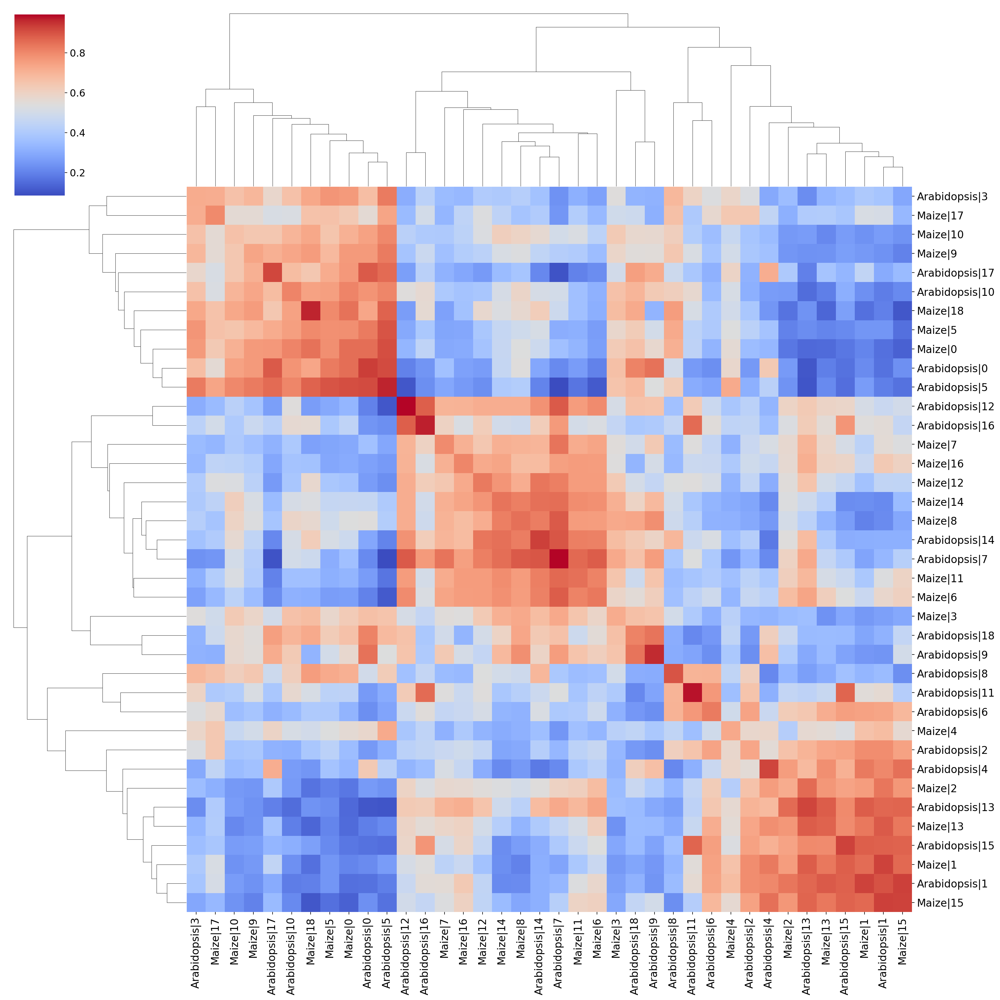

In [77]:
pymn.variableGenes(concatendated_arabi_maize_dataset,study_col = 'Species')
pymn.MetaNeighborUS(concatendated_arabi_maize_dataset,study_col = 'Species',ct_col = 'leiden')
g = pymn.plotMetaNeighborUS(concatendated_arabi_maize_dataset,figsize = (20,20),cmap = 'coolwarm',fontsize = 15,show = False,)
#g.savefig('/home/passala/Gene_duplication_project/Code/Bruno_maize_sorghum_project/Figures/new_data_only_across_species.jpg')

In [78]:
import sklearn

In [79]:
sklearn.metrics.silhouette_score(concatendated_arabi_maize_dataset.X,concatendated_arabi_maize_dataset.obs['leiden'], metric = 'euclidean')

-0.021586597

In [80]:
concatendated_arabi_maize_dataset.obs['Original Cell Cluster Annotation']

AAACCCAAGAGCAGCT-1-Maize               Stele
AAACCCAAGCACCGTC-1-Maize              Phloem
AAACCCAGTGATCATC-1-Maize               Stele
AAACCCATCAGACCCG-1-Maize               Stele
AAACGAACAGATAAAC-1-Maize              Phloem
                                    ...     
TTTGTCACAGGGCATA-Arabidopsis          Phloem
TTTGTCATCAAGGCTT-Arabidopsis           Stele
TTTGTCATCCCACTTG-Arabidopsis          Phloem
TTTGTCATCCTGCCAT-Arabidopsis    Meristematic
TTTGTCATCTCTGCTG-Arabidopsis          Phloem
Name: Original Cell Cluster Annotation, Length: 6672, dtype: category
Categories (5, object): ['Epidermis', 'Meristematic', 'Phloem', 'Root Hair', 'Stele']

In [81]:
concatendated_arabi_maize_dataset.obsm['X_umap']

array([[ 0.37408385,  3.8027766 ],
       [-1.5788851 , 13.2761345 ],
       [-3.258866  ,  5.2972355 ],
       ...,
       [-4.543319  , 10.165324  ],
       [ 1.8850272 ,  4.9080334 ],
       [-0.13628644, 11.41391   ]], dtype=float32)